<a href="https://colab.research.google.com/github/alfianimran/Tol-Trafic-Violation-Detection/blob/master/TolViolation_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [1]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 14995, done.
remote: Total 14995 (delta 0), reused 0 (delta 0), pack-reused 14995
Receiving objects: 100% (14995/14995), 14.07 MiB | 14.92 MiB/s, done.
Resolving deltas: 100% (10286/10286), done.
/content/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [2]:
!pip install -qr requirements.txt
import torch

from IPython.display import Image, clear_output
from utils.downloads import attempt_download


print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 70.2 MB/s eta 0:00:00
Setup complete. Using torch 1.13.1+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [3]:
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 KB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.5/138.5 KB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [4]:
rf = Roboflow(api_key="ik4DtttVYXcNHDBtrzgA")
project = rf.workspace("alfian-imran-x6azu").project("tol-roads")
dataset = project.version(7).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Tol-Roads-7 in yolov5pytorch:: 100%|██████████| 1472/1472 [00:00<00:00, 2804.31it/s]


In [14]:
!pip install wandb
import wandb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [15]:
wandb.login()

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 

··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [16]:
%cat {dataset.location}/data.yaml

names:
- Melanggar
- Tidak Melanggar
nc: 2
roboflow:
  license: CC BY 4.0
  project: tol-roads
  url: https://universe.roboflow.com/alfian-imran-x6azu/tol-roads/dataset/7
  version: 7
  workspace: alfian-imran-x6azu
test: ../test/images
train: Tol-Roads-7/train/images
val: Tol-Roads-7/valid/images


In [17]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [18]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [19]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [20]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [21]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 64 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
wandb: Currently logged in as: alfian-imran52 (alfian). Use `wandb login --relogin` to force relogin
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/Tol-Roads-7/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 435 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.

# Evaluate Custom YOLOv5 Detector Performance

In [22]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

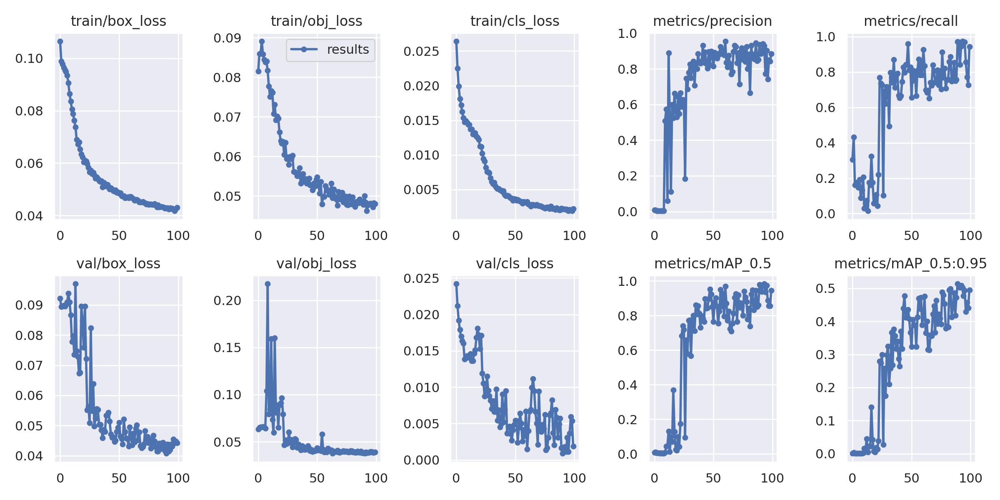

In [23]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


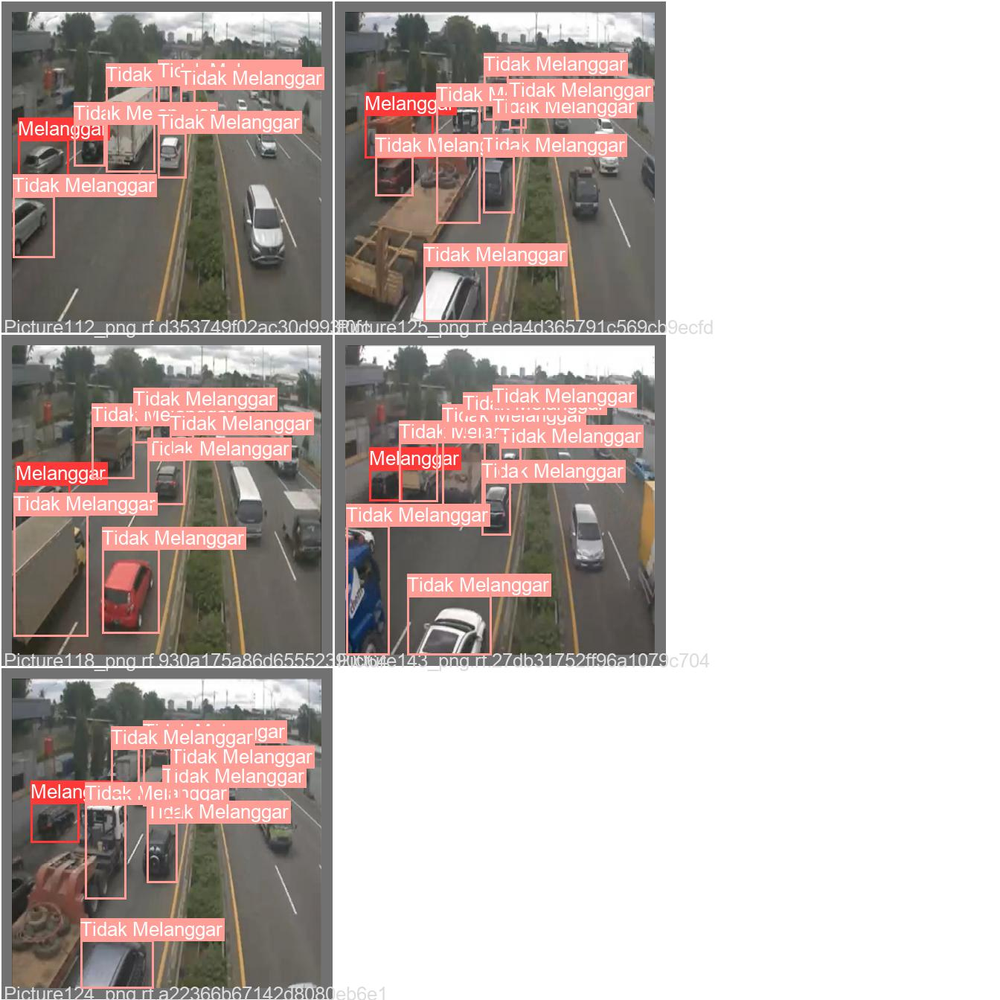

In [24]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


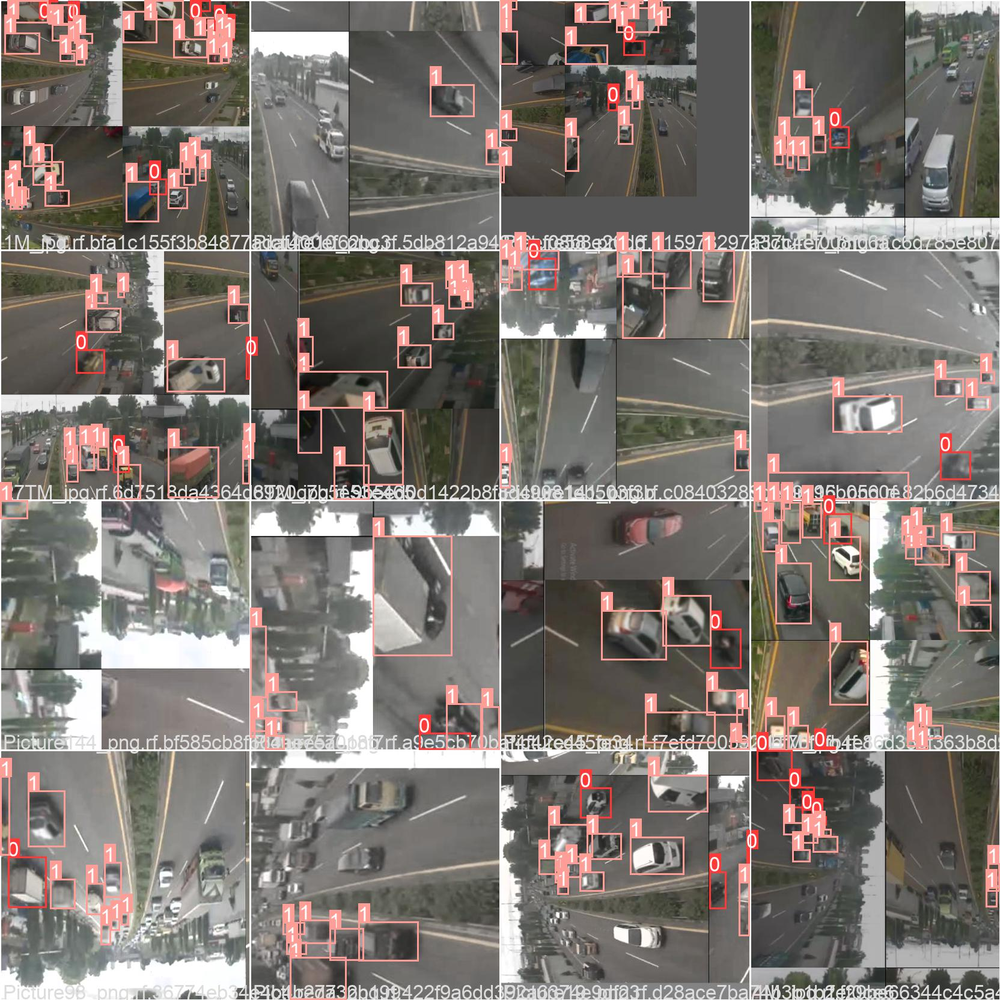

In [25]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Out of Folds Validation / K-Fold Cross Validation

In [26]:
for fold in range(5):    
    print('FOLD NUMBER: ', fold)
    !python train.py --img 416 \
                     --batch 64 \
                     --epochs 100 \
                     --data {dataset.location}/data.yaml \
                     --weights runs/train/yolov5s_results/weights/best.pt \
                     --save-period 10\
                     --project yolov5-tol-violation\
                     --name yolov5s-e-100-img-416-fold-{fold}
    print('###########################################################################################\n')

FOLD NUMBER:  0
wandb: Currently logged in as: alfian-imran52 (alfian). Use `wandb login --relogin` to force relogin
train: weights=runs/train/yolov5s_results/weights/best.pt, cfg=, data=/content/yolov5/Tol-Roads-7/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5-tol-violation, name=yolov5s-e-100-img-416-fold-0, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=10, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 435 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla 

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [27]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [28]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [29]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 640 --conf 0.5 --line-thickness 1 --source Tol-Roads-7/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=Tol-Roads-7/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
image 1/5 /content/yolov5/Tol-Roads-7/test/images/Picture113_png.rf.c65d68772c62286f9a9f22c2136b54c6.jpg: 640x640 2 Melanggars, 7 Tidak Melanggars, Done. (0.014s)
image 2/5 /content/yolov5/Tol-Roads-7/test/images/Picture119_png.rf.4e80cf698b581e26246f7aa58e339633.jpg: 640x640 1 Melanggar, 11 Tidak Melanggars, Done. (0.

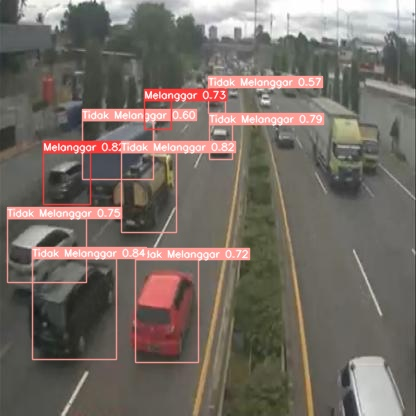

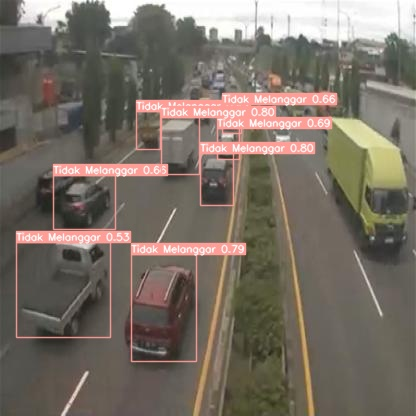

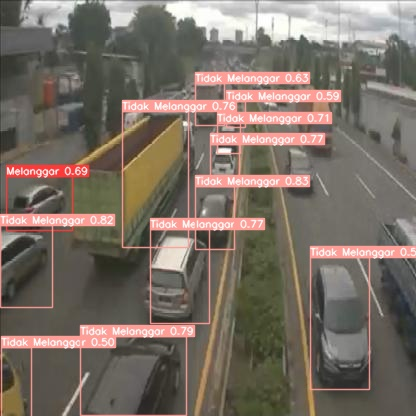

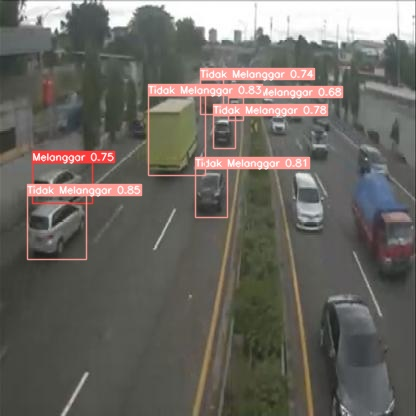

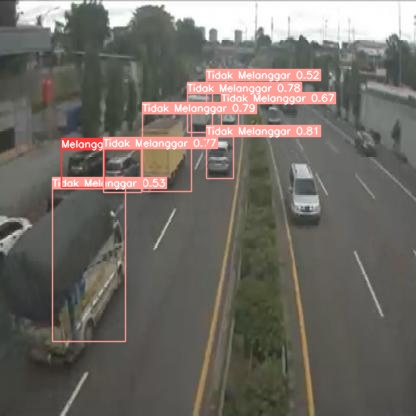

In [30]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

#Validate

In [40]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --iou 0.1 --line-thickness 1 --source image

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=image, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.1, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
image 1/10 /content/yolov5/image/112.png: 320x416 7 Tidak Melanggars, Done. (0.013s)
image 2/10 /content/yolov5/image/Picture1.png: 320x416 2 Melanggars, 8 Tidak Melanggars, Done. (0.009s)
image 3/10 /content/yolov5/image/Picture110.png: 320x416 1 Melanggar, 8 Tidak Melanggars, Done. (0.009s)
image 4/10 /content/yolov5/image/Picture111.png: 288x416 1 M

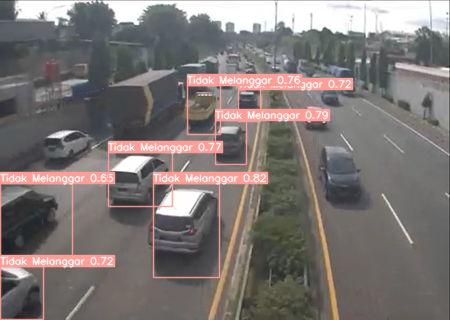

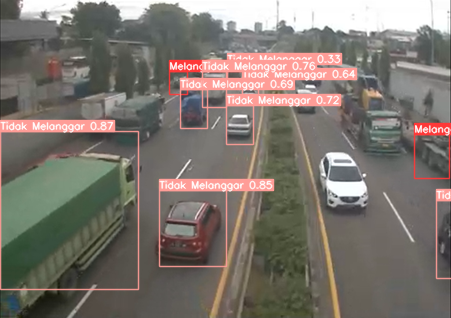

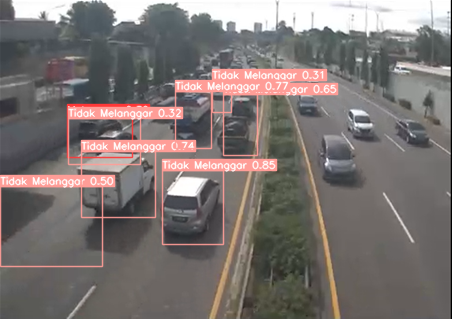

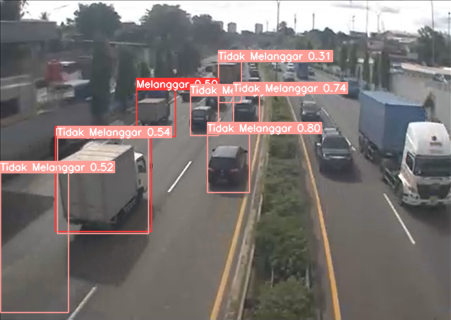

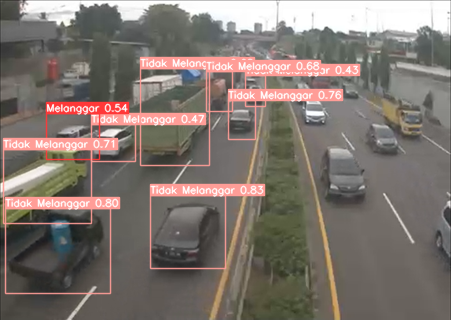

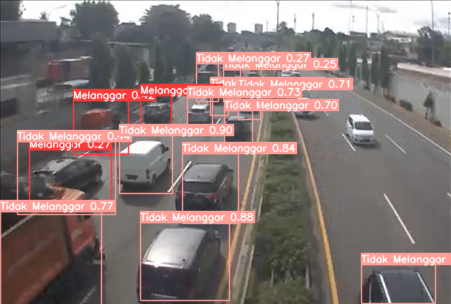

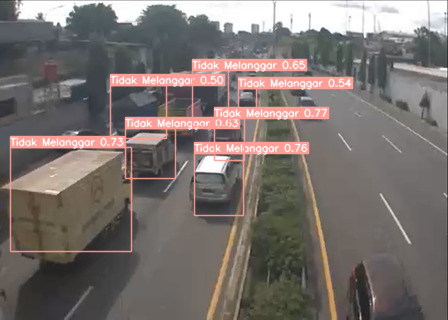

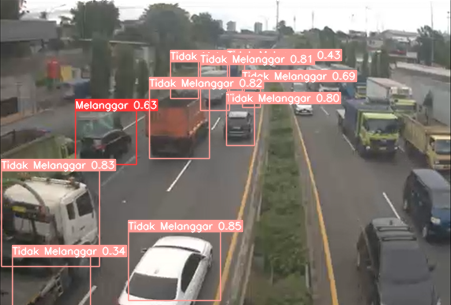

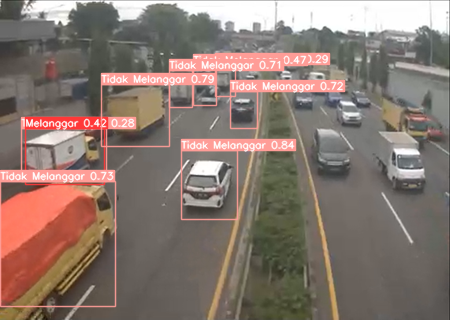

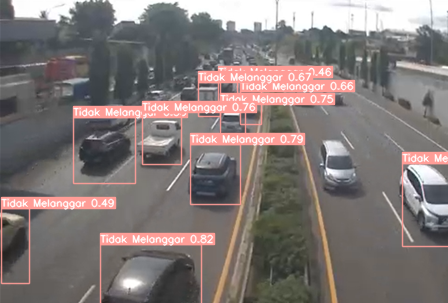

In [41]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp6/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [32]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --line-thickness 1 --source video/12

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=video/12, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
video 1/1 (1/1784) /content/yolov5/video/12/video.mp4: 320x416 4 Tidak Melanggars, Done. (0.013s)
video 1/1 (2/1784) /content/yolov5/video/12/video.mp4: 320x416 4 Tidak Melanggars, Done. (0.010s)
video 1/1 (3/1784) /content/yolov5/video/12/video.mp4: 320x416 4 Tidak Melanggars, Done. (0.012s)
video 1/1 (4/1784) /content/yolov5/video/12/video.mp4: 32

In [33]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --line-thickness 1 --source video/13

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=video/13, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
video 1/1 (1/922) /content/yolov5/video/13/Screen_Recording_20221227-141341_Chrome_1.mp4: 224x416 Done. (0.013s)
video 1/1 (2/922) /content/yolov5/video/13/Screen_Recording_20221227-141341_Chrome_1.mp4: 224x416 Done. (0.010s)
video 1/1 (3/922) /content/yolov5/video/13/Screen_Recording_20221227-141341_Chrome_1.mp4: 224x416 Done. (0.010s)
video 1/1 (4

In [34]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --line-thickness 1 --source video/14

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=video/14, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
video 1/1 (1/1836) /content/yolov5/video/14/Screen_Recording_20221220-135737_Chrome_1.mp4: 320x416 1 Tidak Melanggar, Done. (0.013s)
video 1/1 (2/1836) /content/yolov5/video/14/Screen_Recording_20221220-135737_Chrome_1.mp4: 320x416 1 Tidak Melanggar, Done. (0.009s)
video 1/1 (3/1836) /content/yolov5/video/14/Screen_Recording_20221220-135737_Chrome_1

In [35]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/yolov5

In [ ]:
%cp -r /content/yolov5 /content/gdrive/MyDrive/yolov5

In [36]:
from google.colab import files
!zip -r /content/yolo.zip /content/yolov5

  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/utils/ (stored 0%)
  adding: content/yolov5/utils/downloads.py (deflated 65%)
  adding: content/yolov5/utils/__init__.py (deflated 46%)
  adding: content/yolov5/utils/augmentations.py (deflated 63%)
  adding: content/yolov5/utils/flask_rest_api/ (stored 0%)
  adding: content/yolov5/utils/flask_rest_api/restapi.py (deflated 46%)
  adding: content/yolov5/utils/flask_rest_api/README.md (deflated 52%)
  adding: content/yolov5/utils/flask_rest_api/example_request.py (deflated 26%)
  adding: content/yolov5/utils/metrics.py (deflated 66%)
  adding: content/yolov5/utils/callbacks.py (deflated 69%)
  adding: content/yolov5/utils/__pycache__/ (stored 0%)
  adding: content/yolov5/utils/__pycache__/autoanchor.cpython-38.pyc (deflated 42%)
  adding: content/yolov5/utils/__pycache__/general.cpython-38.pyc (deflated 50%)
  adding: content/yolov5/utils/__pycache__/metrics.cpython-38.pyc (deflated 47%)
  adding: content/yolov5/utils/__pycac

In [37]:
files.download('/content/yolo.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download('/content/yolov5/runs/detect/exp4/Screen_Recording_20221220-135737_Chrome_1.mp4')